# Full pathway of `DeepExtremes` training: Dataloader + Training + Validation

This repository contains the weights to the three models discussed in the paper: the base model (`'2024_04_base'`), and its two ablations (`'2024_04_0lstm'`, `'2024_04_1x1'`).

To **validate** using one of these models:
 1) Set `config['experiment_id']` in section [Basics](#Basics) to one of the trained models
 2) Check the configuration that this changes that this entails in section [Configuration overrides](#Configuration-overrides) (no need to do anything here)
 3) Make sure that `config['implementation']['trainer']['epochs']= 0` in section [Training epochs](#Training-epochs) so that the model does not train for more epochs
 
To **train** a new model changing the configuration:
 1) Set `config['experiment_id']` [Basics](#Basics) to a custom name describing the experiment
 2) Make any configuration changes in section [Configuration overrides](#Configuration-overrides)
 3) Make sure that `config['implementation']['trainer']['epochs']= 4` in section [Training epochs](#Training-epochs) so that the model trains for 4 epochs

## Load libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#Patch some bugs
#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

#https://github.com/Lightning-AI/lightning/issues/15254
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
import numpy as np
import pandas as pd
import os, sys, yaml
from pathlib import Path
from pprint import pprint
from datetime import datetime
from lovely_numpy import lo

#Reset matplotlib config and change defaults
import matplotlib.pyplot as plt, matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)    
plt.style.use('ggplot')
mpl.rcParams.update({'font.size': 10})

## Generate configuration file

The configuration dictionary `config` will contain all the hyperparameters defining an experiment, e.g.: the names of the variables, the data paths, standarization strategies, network architecture, etc.

Most of the paramteres used here will be dependent on the specific dataset and task, but can serve as a guideline for other tasks.

### Basics

In [4]:
#Create config
config_path= Path('./configs').resolve()
config={}

config['debug']= False #If true, dataloader or model may choose to print more info or to run a quick test run
config['seed']= 42

#Define the name of the experiment (all artifacts will be saved under a folder with this name)
# config['experiment_id']= datetime.now().strftime('%H_%M_%S_%Y_%m_%d') + '_DeepExtremesCustom' #Random

config['experiment_id']= '2024_04_base' #Base: 4-epoch full-res-only, no dilation
# config['experiment_id']= '2024_04_0lstm' #No LSTM, just convolutions
# config['experiment_id']= '2024_04_1x1' #Uses only 1x1 convolutions (no spatial context)

#Define the path of the experiments
config['save_path']= str(Path('experiments') / config['experiment_id'])

### Data paths and subsets

In [5]:
config['data']={}
config['data']['name']= 'DeepExtremes' #torch.utils.data.Dataset, to be imported as eval(config['data']['name'])

#Paths
config['data']['datacubes_path']= str(Path('/scratch/users/deepextremes/'))
config['data']['registry_path']= str(
    Path('/scratch/users/deepextremes/deepextremes-minicubes/registry_2023_11_03_11_20_21.csv').expanduser().resolve())
config['data']['blacklist_path']= str(Path('./subsets/bad_cubes_final.txt').resolve())
config['data']['testlist_path']= None #Set to none to use .csv file! str(Path('./test_cubes_new.txt').resolve())
config['data']['testlist_csv']= str(Path('/scratch/users/deepextremes/demc_full_10groups_50km.csv'))
config['data']['testlist_fold']= 5 #If using csv, the fold to use for test: 0-9

#For replicability, keep only cubes that were generated up to a certain date (we use all of them as of now)
config['data']['registry_read_until']= datetime.strptime('11/20/2023', '%m/%d/%Y').strftime('%m/%d/%Y')

#We will not train with data from this point onward, which is reserved for val / test
config['data']['test_start_date']= datetime.strptime('10/08/2021', '%m/%d/%Y').strftime('%m/%d/%Y')

#How many timesteps into to the future to predict
config['data']['prediction_period']= 1# Predict in N*5 days

#Configure cube versions and splits
# config['data']['versions']= ['1.1', '1.2.2'] #What versions of datacubes to use
config['data']['versions']= None #E.g.: '1.1', '1.2.2', etc. if None, use all
config['data']['split']= {}
config['data']['split']['train']= 0.75 #Training dataset split
config['data']['split']['val']= 0.1 #Validation dataset split
config['data']['split']['test']= 0.15 #Test dataset split. By default, this will only use the testlist (see above)

### Data variable definition and processing

In [6]:
#We use different processing of the variables depending on their dimensionality:
# - tyx: tempo-spatial
# - xy: spatial
# - t: temporal
# - _: a single value for the whole data cube (unused)
#And depending on their type:
# - _real: real variables
# - _cat: categotical variables
#mask is a special type, and is a cat upon which the validity of the input data is decided (e.g. a cloud mask)

#Define the names of the variables depending on their dimensionality [tyx, xy, t] and type [_real, _cat]
config['data']['variables']= {}
#txy_real is a subset of ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A']
config['data']['variables']['txy_real']= ['B02', 'B03', 'B04', 'B8A'] 
config['data']['variables']['txy_cat']= [] #['SCL'] #Do not use SCL at all for now
config['data']['variables']['txy_mask']= ['cloudmask_en'] #Special _cat that is used for global valid masking
config['data']['variables']['xy_cat']= ['lccs_class']
config['data']['variables']['xy_real']= ['cop_dem']
config['data']['variables']['t_real']= [f'{v}_{a}' for a in ['min', 'max', 'mean'] #Build ERA5-derived var names
                   for v in ['e', 'pev', 'slhf', 'sp', 'sshf', 'ssr', 't2m', 'tp']]
#config['data']['variables']['_real']= [] #['lon', 'lat'] (unused)
config['data']['variables']['labels_t']= ['event_labels']
config['data']['variables']['predict_features']= ['B02', 'B03', 'B04', 'B8A'] #Output features
config['data']['variables']['use_txy_mask_as_input']= True #Include txy_mask also in the inputs?

#There exist several possible standarization strategies for _real data.
# - If a tuple is provided (vmin, vmax): scale data linearly so that vmin -> 0, vmax -> 1, and extremes are cut off
#Get minmax standarization values for _real data
config['data']['minmax']= {}
config['data']['minmax']['txy_real_minmax']= [1.]*len(config['data']['variables']['txy_real'])
config['data']['minmax']['xy_real_minmax']= [8849.] #This is the dem
config['data']['minmax']['t_real_minmax']= [(-0.005, 0), (-0.02, 0), (-10_000_000, 0), (88_000, 96_000),
                                (-6_000_000, 1_000_000), (3_000_000, 15_000_000), (260, 310), (0, 0.02)]

#Get class meanings for _cat and _mask classes
config['data']['classes']= {}
config['data']['classes']['txy_cat']= [{
    0: 'no_data', 1: 'saturated_or_defective', 2: 'dark_area_pixels', 
    3: 'cloud_shadows', 4: 'vegetation', 5: 'bare_soils', 6: 'water', 
    7: 'clouds_low_probability_or_unclassified', 8: 'clouds_medium_probability', 9: 'clouds_high_probability', 
    10: 'cirrus', 11: 'snow_or_ice'}]
config['data']['classes']['xy_cat']=[{
    10: 'no_data', 11: 'cropland_rainfed', 12: 'cropland_rainfed_herbaceous_cover', 
    20: 'cropland_rainfed_tree_or_shrub_cover', 30: 'cropland_irrigated', 40: 'mosaic_cropland', 
    50: 'mosaic_natural_vegetation', 60: 'tree_broadleaved_evergreen_closed_to_open', 
    61: 'tree_broadleaved_deciduous_closed_to_open', 62: 'tree_broadleaved_deciduous_closed', 
    70: 'tree_broadleaved_deciduous_open', 71: 'tree_needleleaved_evergreen_closed_to_open', 
    72: 'tree_needleleaved_evergreen_closed', 80: 'tree_needleleaved_evergreen_open', 
    81: 'tree_needleleaved_deciduous_closed_to_open', 82: 'tree_needleleaved_deciduous_closed', 
    90: 'tree_needleleaved_deciduous_open', 100: 'tree_mixed', 110: 'mosaic_tree_and_shrub', 
    120: 'mosaic_herbaceous', 121: 'shrubland', 122: 'shrubland_evergreen', 130: 'shrubland_deciduous', 
    140: 'grassland', 150: 'lichens_and_mosses', 151: 'sparse_vegetation', 152: 'sparse_tree', 153: 'sparse_shrub', 
    160: 'sparse_herbaceous',170:'tree_cover_flooded_fresh_or_brakish_water',180:'tree_cover_flooded_saline_water', 
    190: 'shrub_or_herbaceous_cover_flooded', 200: 'urban', 201: 'bare_areas', 202: 'bare_areas_consolidated'}]
#NOTE: cloud_shadows and snow have been manually swapped here, as there is a mistake in the minicube metadata. 
#THIS is the correct labelling:
config['data']['classes']['txy_mask']= [{0: 'free_sky', 1: 'cloud', 3: 'cloud_shadows', 
                                         2: 'snow', 4: 'masked_other_reasons'}]

#There exist several possible processing strategies for _cat data
#E.g.: Assuming _cat has classes 0,1,2,3,4
# - [1,3]: Single output channel, set to one if class is 1 or 3
# - [None]: Multiple output channel, converts all classes to one-hot and removed the first channle
#           This is the same as [[1,2,3,4]] (notice double list, see below)
# - [[1,2], [3,4]]: Get a one-hot array with first entry for classes 1 or 2, and second entry for classes 3 or 4 
config['data']['classes_process']={}
config['data']['classes_process']['txy_cat']= [None] #Standard processing: all to one hot
config['data']['classes_process']['xy_cat']= [None] #Standard processing: all to one hot
config['data']['classes_process']['txy_mask']= [[1, 3, 4]] #No snow, since it is not always correctly masked

#Perform some on-the-fly computations on the data
config['data']['compute']= {}
#Ignore first N samples of all available timesteps: we ignore the whole two years (73*5*2=365*2)
#The first year, data is generally unavailable as only one of the two sentinel 2 satellites was operational
#The second year, because we want to have a whole year to be able to compute some climatology values
config['data']['compute']['ignore_first_N']= 73*2 #Ignore first 2 years of samples
config['data']['compute']['ndvi']= False #Do not compute NDVI from the inputs
if config['data']['compute']['ndvi']: 
    config['data']['minmax']['txy_real_minmax']+= [1.] #Add extra minmax normalizer if NDVI is used
config['data']['compute']['clima']= True #Compute climatology (txy vars)
if config['data']['compute']['clima']: 
    config['data']['minmax']['txy_real_minmax']*= 2 #Repeat minmax normalizer if clima is used
config['data']['compute']['smooth_clima']= 1 #Use linear/quadratic interpolation for clima vars
config['data']['compute']['detrend_txy']= False #Detrend RGBnir using clima
#If true, compute the clima of the output timestep, not the input timestep
#This is causal! Because the clima is created using only past data
config['data']['compute']['clima_next']= True 
    
#Compute climatology (xy vars, aka ERA5 aggregations). Here we have many custom processing options:
config['data']['compute']['era5_clima']= True #Compute climatology (xy vars)
#If true, do not include the detrended _mean values (just include the _mean_clima values)
config['data']['compute']['era5_clima_delete_mean']= True 
 #If true, use minmax clima for detrending minmax values, otherwise use mean clima
config['data']['compute']['era5_clima_detrend_min_max']= True
#If true, do not include the _min_clima and _max_clima values (just include the _min and _max values)
config['data']['compute']['era5_clima_delete_min_max_clima']= True 
#Include t_next instead of t in the input. 
#This is a non-causal use of ERA5, with assumption that forecasts up to prediction_period would be available
config['data']['compute']['t_next']= True   

#New standarizaton values: computed from 10% of all available cubes (15k) to leave 0.01% data at each side
if config['data']['compute']['era5_clima']:
    config['data']['minmax']['t_real_minmax']=\
        [0.0025041749448515473, 0.012208842822908345, 6262440.3864, 3394.3465218749498, 
         5197468.781599337, 8231326.5132, 20.253179840087892, 
         0.02629283503293989] * (2 if config['data']['compute']['era5_clima_delete_mean'] else 3) +\
        [(-0.0036388258449733257, 7.505431858589873e-05), 
         (-0.029522577300667763, 5.541076461668126e-05), (-9099976.0, 223287.3125), (51622.5546875, 102771.5703125),
         (-8806705.0, 2158302.25), (-0.003333333181217313, 17229930.0), (236.65975952148438, 312.64947509765625), 
         (3.0870606337884965e-07, 0.017818428575992584)] * (1 
                                        if config['data']['compute']['era5_clima_delete_min_max_clima'] else 3)
       
#Process xy_real as mean + dev
config['data']['compute']['xy_real_mean_dev']= False
if config['data']['compute']['xy_real_mean_dev']: #[DEM dev, DEM mean]
    config['data']['minmax']['xy_real_minmax']= [(-500., 500.), (0., 6000.)] 
    
#Final compute
config['data']['compute']['return_as_pytorch']= True #If true, data is returned as pytorch tensors
config['data']['compute']['return_just_cubes']= False #If true, all data is concatenated into a single cube
#If true, downscale image to half resolution for debugging (e.g.: 1/4 VRAM usage)
config['data']['compute']['low_res']= False
config['data']['compute']['return_labels_t']= True #If true, extreme envent labels are computed and returned
#Clip off any values that at the are outside these limits, at the very end, AFTER all processing has finished
config['data']['compute']['sanitization_limits']= (-5, 5)

#Apply very simple random augmentations
config['data']['augment']={}
config['data']['augment']['rotate90']= True #Rotate [0,90,180,270] randomly
config['data']['augment']['flip']= True #Flip or no-flip randomly

### Model implementation, loss, evaluation, and architecture

In [7]:
#Configurations for the model
config['implementation']={}
config['implementation']['data_loader']={'num_workers': 4} #Dataloader worker processes

#Loss definition
#We use a custom loss function, a weighted (over channels) L2, where NDVI is more highly weighted than the bands
config['implementation']['loss']= {'masked': True, 'package': 'torch.nn', 
                                   'type': 'L1L2Loss', 'user_defined': True, 
                                   'params': {'reduction': 'none', 'lam':1.,'weights':[.125,.125,.125,.125,0.5]},
                                   # 'type': 'L1Loss', 'user_defined': False, 'params': {'reduction': 'none'}
                                  }

#Optimizer configuration. LR is also later overwritten during training
config['implementation']['optimizer']= {'gclip_value': 0, 'lr': 0.001, 'type': 'AdamW'}
config['implementation']['trainer']= {'accelerator': 'gpu', 'epochs': 4,
  'train_batch_size': 1, 'val_batch_size': 1, 'test_batch_size': 1, 
  'devices': 1, 'early_stop': 10000, #Disable early_stop
  'monitor': {'metric': 'NormalizedNashSutcliffeEfficiency_custom_NNSE', 'split': 'val'}, 'monitor_mode':'min'}
config['implementation']['trainer']['accumulate_grad_batches']= 8 #Keep effective batch size at 8
config['implementation']['trainer']['precission']= 32 #16 is not working as of now for some reason
config['implementation']['trainer']['plot_every_epoch']= 1

#We can use different LRs for different sets of data (t, xy, txy, _). 
#Here, we define the factors by which the LR associated to that data will be multiplied
#E.g.: {'xy':128, 't':350}. For now, we disable it like this
config['implementation']['optimizer']['lr_correction']= {} 

#Include useful meta information needed by the model
config['implementation']['band_names']= ['B02', 'B03', 'B04', 'B8A']
config['implementation']['clima_names']= ['B02_clima_next', 'B03_clima_next', 'B04_clima_next', 'B8A_clima_next']
config['implementation']['cloud_mask_name']= 'cloudmask_en:cloud_OR_cloud_shadows_OR_masked_other_reasons'

#Evaluation configuration
config['evaluation']={}
config['evaluation']['metrics']={'MeanSquaredError':{'squared':False}, 'NormalizedNashSutcliffeEfficiency_custom':{}, 
                                 'R2Score':{}, 'L1_custom':{}}
#We can choose some channels to NOT evaluate
config['evaluation']['not_apply_metrics_to_channels']= [0,1,2,3] #Evaluate only NDVI

#Model architercture configuration
config['arch']= dict(input_dimension=(24, 35, 9), #t, xy, txy
                     lstm_hidden_size=60, lstm_kernel_size=(3,3),
                     lstm_num_layers=3, mlp_layer_sizes=[10], user_defined=True, lstm_convs_per_layer=1,
                     num_classes=len(config['data']['variables']['predict_features']),
                     dilation= 1  #If >1 use atrous convolutions. If 1, use normal convolutions
                     )
#Split training into temporal chunks to improve training speeds, None to disable. Legacy, do not use
config['arch']['chunk_size']= None
#We compute difference to clima for all variables
config['arch']['difference_to_clima']= True
#If not None, set a continuous set of reflectances to zero during training strating from a random timestep and 
#lasting with a random amount of time between (low, high)
config['arch']['random_zeroing_duration']= None #(0, 73) #Up to a year

### Configuration overrides

In [8]:
if config['experiment_id']== '2024_04_base':
    pass
elif config['experiment_id'] == '2024_04_0lstm':
    config['arch']['lstm_convs_per_layer']= 3
    config['arch']['no_memory']= True #Custom flag for disabling LSTM for ablation
    config['arch']['lstm_hidden_size']= 50
    config['arch']['lstm_num_layers']= 1
#Split training into tempora
elif config['experiment_id'] =='2024_04_1x1':
    config['arch']['lstm_hidden_size']=150
    config['arch']['lstm_kernel_size']=(1,1)

### Training epochs

In [9]:
#If set to 0, we disable training and only do inference
config['implementation']['trainer']['epochs']= 0

In [10]:
pprint(config)

{'arch': {'chunk_size': None,
          'difference_to_clima': True,
          'dilation': 1,
          'input_dimension': (24, 35, 9),
          'lstm_convs_per_layer': 1,
          'lstm_hidden_size': 60,
          'lstm_kernel_size': (3, 3),
          'lstm_num_layers': 3,
          'mlp_layer_sizes': [10],
          'num_classes': 4,
          'random_zeroing_duration': None,
          'user_defined': True},
 'data': {'augment': {'flip': True, 'rotate90': True},
          'blacklist_path': '/home/oscar/xytXAI/subsets/bad_cubes_final.txt',
          'classes': {'txy_cat': [{0: 'no_data',
                                   1: 'saturated_or_defective',
                                   2: 'dark_area_pixels',
                                   3: 'cloud_shadows',
                                   4: 'vegetation',
                                   5: 'bare_soils',
                                   6: 'water',
                                   7: 'clouds_low_probability_or_unclassif

In [11]:
#Save config
#yaml.dump(config, open(config_path / 'config_DeepExtremes.yaml','wt'))
os.makedirs(config['save_path'], exist_ok=True)

## Create dataloader

Create dataloader and examine `TRY_BATCHES` batches

/home/oscar/xytXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Using blacklist_file=Path('/home/oscar/xytXAI/subsets/bad_cubes_final.txt') with 434 items
Found 36522 minicubes with subset='all', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes
cube_path='deepextremes-minicubes/full/1.3/mc_-68.82_9.57_1.3_20230928_0.zarr'
t_idx[test_start_idx]=numpy.datetime64('2021-10-08T12:00:00.000000000'), self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0)
t_unique=array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
txy_real.shape=(4, 495, 128, 128)


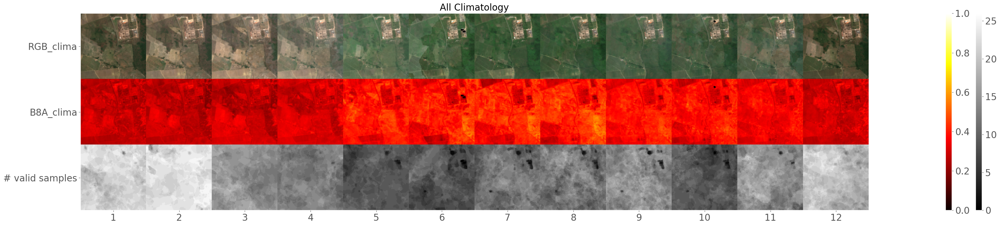

Processed txy_real
Processed t_real
Plotting


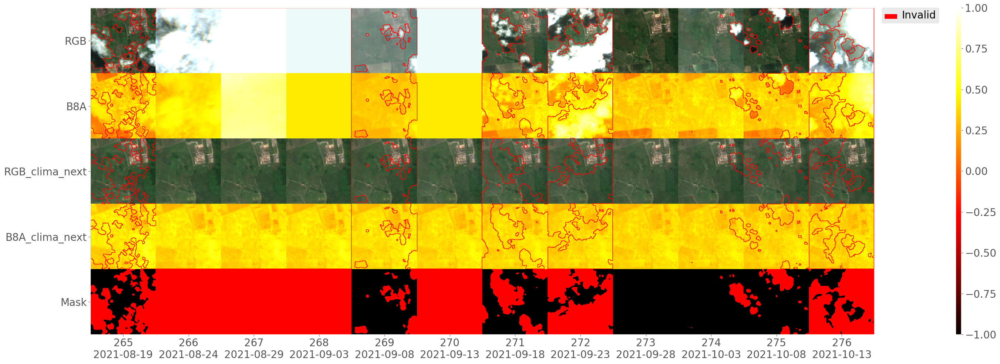

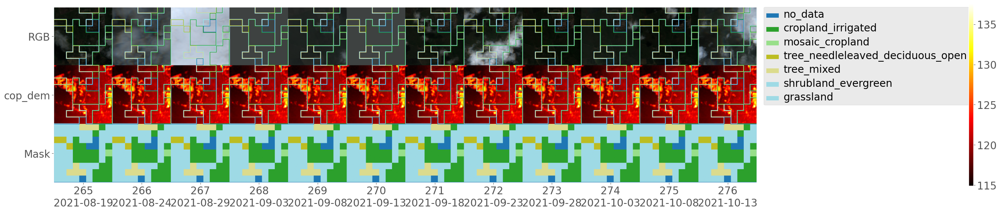

fData was i=0 (deepextremes-minicubes/full/1.3/mc_-68.82_9.57_1.3_20230928_0.zarr)

- t: tensor[24, 349] n=8376 (33Kb) x∈[-0.904, 2.355] μ=0.217 σ=0.366. Var names: ['e_min_detrend_next', 'pev_min_detrend_next', 'slhf_min_detrend_next', 'sp_min_detrend_next', 'sshf_min_detrend_next', 'ssr_min_detrend_next', 't2m_min_detrend_next', 'tp_min_detrend_next', 'e_max_detrend_next', 'pev_max_detrend_next', 'slhf_max_detrend_next', 'sp_max_detrend_next', 'sshf_max_detrend_next', 'ssr_max_detrend_next', 't2m_max_detrend_next', 'tp_max_detrend_next', 'e_mean_clima_next', 'pev_mean_clima_next', 'slhf_mean_clima_next', 'sp_mean_clima_next', 'sshf_mean_clima_next', 'ssr_mean_clima_next', 't2m_mean_clima_next', 'tp_mean_clima_next']

- xy: tensor[35, 128, 128] n=573440 (2.2Mb) x∈[0., 1.000] μ=0.028 σ=0.164. Var names: ['cop_dem', 'lccs_class:cropland_rainfed', 'lccs_class:cropland_rainfed_herbaceous_cover', 'lccs_class:cropland_rainfed_tree_or_shrub_cover', 'lccs_class:cropland_irrigated', 'lccs_clas

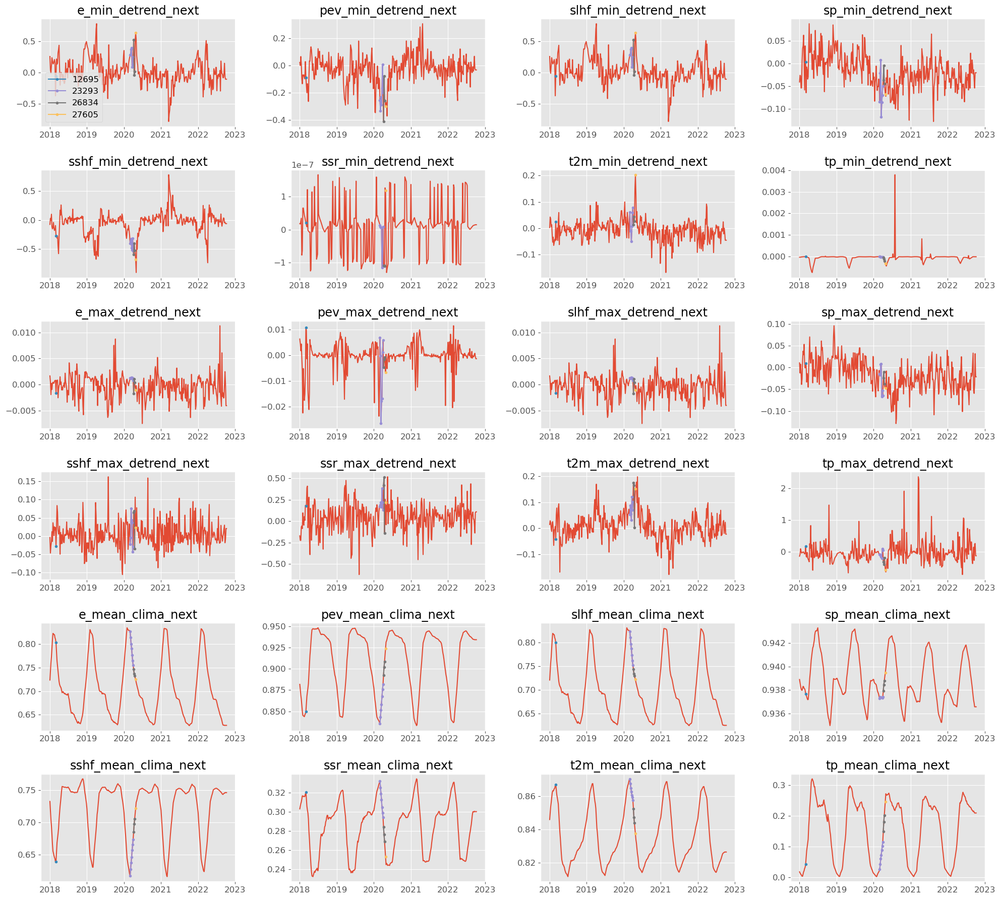

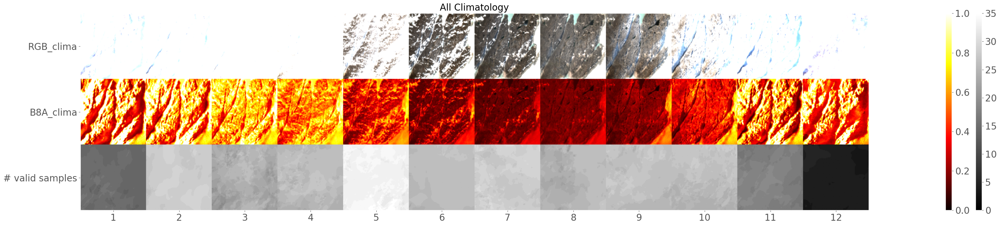

Processed txy_real
Processed t_real
Plotting


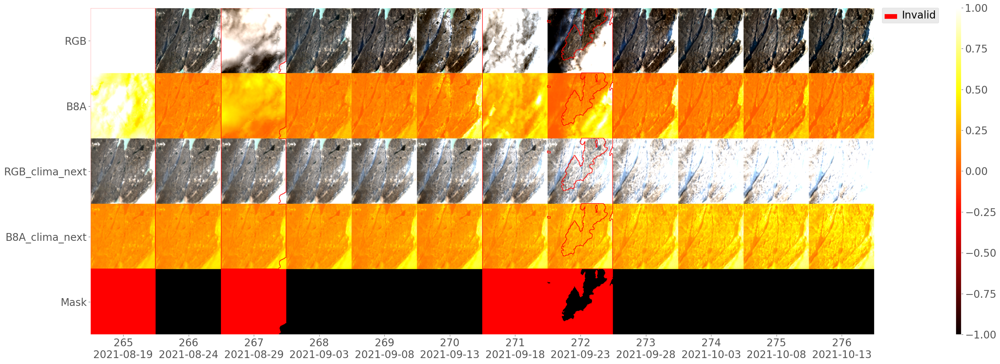

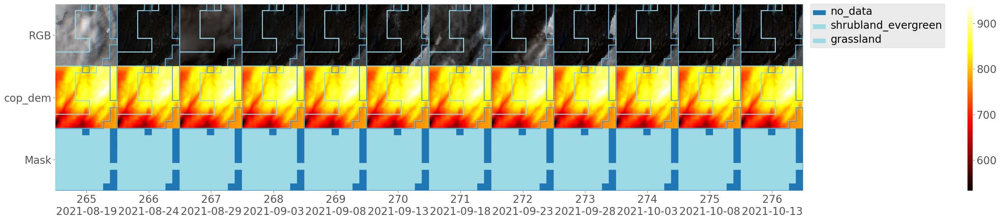

fData was i=1 (deepextremes-minicubes/full/1.1/mc_-47.92_61.73_1.1_20230611_0.zarr)

- t: tensor[24, 349] n=8376 (33Kb) x∈[-1.216, 1.862] μ=0.216 σ=0.406. Var names: ['e_min_detrend_next', 'pev_min_detrend_next', 'slhf_min_detrend_next', 'sp_min_detrend_next', 'sshf_min_detrend_next', 'ssr_min_detrend_next', 't2m_min_detrend_next', 'tp_min_detrend_next', 'e_max_detrend_next', 'pev_max_detrend_next', 'slhf_max_detrend_next', 'sp_max_detrend_next', 'sshf_max_detrend_next', 'ssr_max_detrend_next', 't2m_max_detrend_next', 'tp_max_detrend_next', 'e_mean_clima_next', 'pev_mean_clima_next', 'slhf_mean_clima_next', 'sp_mean_clima_next', 'sshf_mean_clima_next', 'ssr_mean_clima_next', 't2m_mean_clima_next', 'tp_mean_clima_next']

- xy: tensor[35, 128, 128] n=573440 (2.2Mb) x∈[0., 1.000] μ=0.027 σ=0.156. Var names: ['cop_dem', 'lccs_class:cropland_rainfed', 'lccs_class:cropland_rainfed_herbaceous_cover', 'lccs_class:cropland_rainfed_tree_or_shrub_cover', 'lccs_class:cropland_irrigated', 'lccs_cla

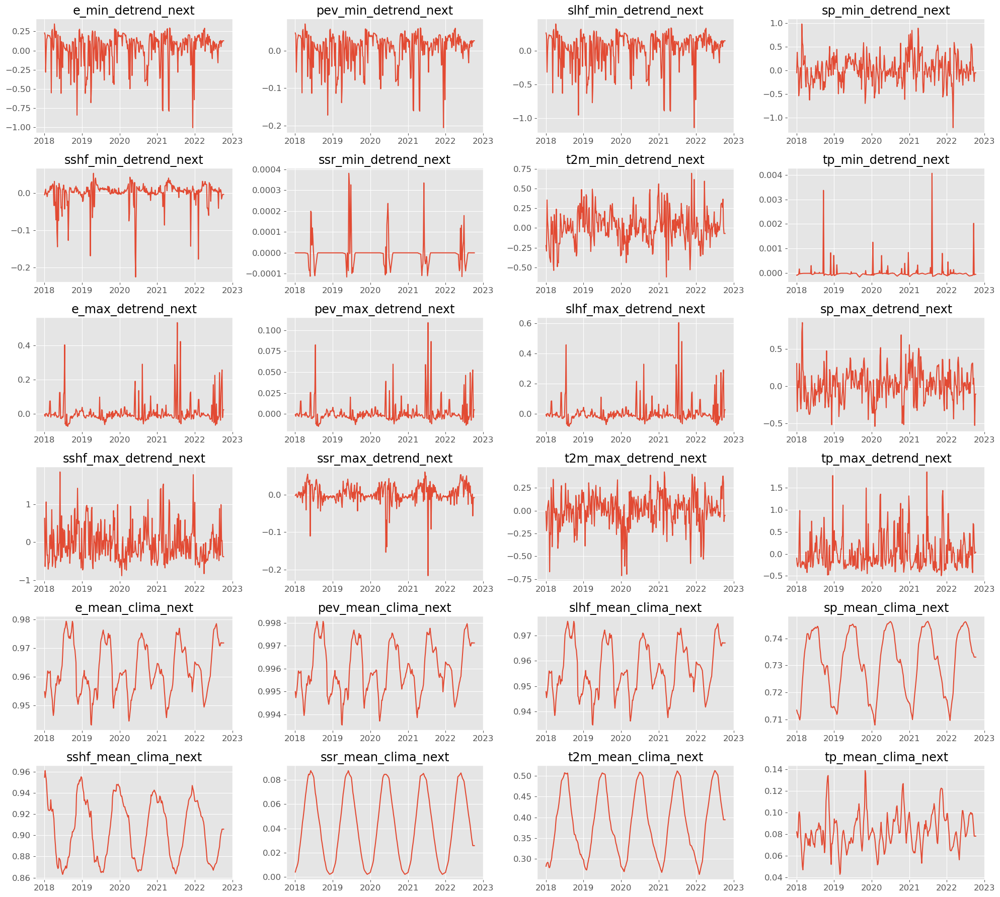

In [12]:
TRY_BATCHES= 2

from lib.data_loader import DeepExtremes
from lib.data_utils import setup_matplotlib
setup_matplotlib()
import lovely_tensors as lt

lt.monkey_patch()
if TRY_BATCHES > 0:
    self= reversed(DeepExtremes(config, debug=True, subset='all')) #reversed
    for i, data in enumerate(self): #self['103.25_26.00']
        #Examine outputs
        print(f'fData was {i=} ({data["meta"]["id"]})')
        for k,v in data.items():
            if k == 'meta': 
                #print(f"{data['meta']['event_labels']=}")
                pprint({k1 : (f'{v1[:30]}{"..." if len(v1)>30 else ""}' if hasattr(v1, '__len__') else v1) 
                       for k1,v1 in v.items() if k1 != 'names'})
            else:
                try: print(f'\n- {k}: {v}. Var names: {data["meta"]["names"][k]}')
                except: print(f' - {k}: {v.shape}')
        if i==TRY_BATCHES-1: break #Only a few samples

## Training

In [15]:
from lib.model_manager import ModelManager
import torch

#For debugging
#torch.autograd.set_detect_anomaly(True)
#config['implementation']['data_loader']['num_workers']= 1 #Only for debugging
print(torch.__version__)

torch.set_float32_matmul_precision('high') #'medium' | 'high'
sample= [None, 200, 200] #Sample Train, Val, Test data samples (for speed)

#Train
if config['implementation']['trainer']['epochs'] > 0:
    model_manager= ModelManager(config)
    model_manager.implement_model()
    model_manager.load_data(sample=sample)
    try:
        model_manager.load_last() #Load last weight
    except Exception as e:
        print(f'Exception loading last weights: {e}')
    print(model_manager.model)
    model_manager.train()

2.3.0


### Running Tensorboard

```
cd DeepExtremesXAI/experiments/
tensorboard --port 8891 --logdir . --host=0.0.0.0
```

Then go to [`localhost:8891`](localhost:8891) on your browser

## Validation

In [13]:
#Batch size must be 1 and low_res=False for evaluation to be correct
assert int(config['data']['compute']['low_res']) == 0, \
    'You are not evaluating at full resolution. If this is expected behavior, comment out this line'
config['implementation']['trainer']['train_batch_size']= 1
config['implementation']['trainer']['val_batch_size']= 1
config['implementation']['trainer']['test_batch_size']= 1
config['implementation']['data_loader']['num_workers']= 4

In [14]:
#We now create another modelManager for evaluation
model_manager= ModelManager(config)
torch.cuda.empty_cache()
model_manager.implement_model()
sample= [1000, None, None] #Sample only 1000 samples for training set evaluation
model_manager.load_data(sample=sample, test_mode='testlist')
model_manager.load_best() #Load best weight

Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
/home/oscar/DeepExtremesXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Found 27379 minicubes with subset='train', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes


/home/oscar/DeepExtremesXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Found 3644 minicubes with subset='val', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes


/home/oscar/DeepExtremesXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Found 3678 minicubes with subset='test', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes
Loaded model from experiments/2024_04_base/checkpoints/epoch=0-val_NormalizedNashSutcliffeEfficiency_custom_NNSE=0.777310.ckpt


xytConvLSTM(
  (loss): L1L2Loss(
    (l1): L1Loss()
    (l2): MSELoss()
  )
  (rnn): ConvLSTMCustom(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Sequential(
          (0): Conv2d(128, 240, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (1-2): 2 x ConvLSTMCell(
        (conv): Sequential(
          (0): Conv2d(120, 240, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
    )
  )
  (mlp): MLP(
    (0): Linear(in_features=60, out_features=10, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.0, inplace=False)
    (3): Linear(in_features=10, out_features=4, bias=True)
    (4): Dropout(p=0.0, inplace=False)
  )
)

In [15]:
#The model has several naive modes implemented within for comparison
# - None: just use the trained model for evaluation
# - climatology: use the climatology as the prediction (e.g. predict always zero)
# - last-value: use the last non-cloud occluded value as the prediction
naive_models= [None] #['climatology', 'last-value', None]
#Select the subsets on which to evaluate the model
subsets= ['train', 'val', 'test'] #['train', 'val', 'test']
#If blind, the satellite data is set to zero fot the last year of prediction
blind= [False] #[True, False]
#The model can also be evaluated only on event / non-event areas
# - 'none': evaluate over no event timesteps 
# - 'all': evaluate over all event timesteps
# - int: evaluate over a specfic event
# - None (evaluate all events and non-events)
event_metrics= [None] #[None, 'none', 'all']

#Evaluate for all subsets on all naive models selected
from itertools import product
for i, (subset, naive, blind, event) in enumerate(product(subsets, naive_models, blind, event_metrics)):
    if blind and naive is not None: continue #Does not make sense to test blind AND naive
    print(f'\n{subset=} {sample=} {naive=} {blind=} {event=}')
    model_manager.val(subset=subset, plot=0, naive=naive, blind_test=blind, event_metrics=event)


subset='train' sample=[1000, None, None] naive=None blind=False event=None
Plotting first 0 batches


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.
/home/oscar/.conda/envs/pt2/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:492: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 Validate metric                                   DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 val_L1_custom_0                                0.04352394863963127
             val_MeanSquaredError_0                             0.08106274157762527
val_NormalizedNashSutcliffeEfficiency_custom_NNSE               0.7889860272407532
val_NormalizedNashSutcliffeEfficiency_custom_NSE                0.6938129663467407
val_NormalizedNashSutcliffeEfficiency_custom_bias              0.009048324078321457
                  val_R2Score_0                                 0.8775511980056763
                    val_loss                                   0.008049231953918934
─────────────────────────────────────────────────────────────────────────────────────────────

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.



subset='val' sample=[1000, None, None] naive=None blind=False event=None
Plotting first 0 batches


Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 Validate metric                                   DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 val_L1_custom_0                                0.04132341220974922
             val_MeanSquaredError_0                             0.07919522374868393
val_NormalizedNashSutcliffeEfficiency_custom_NNSE               0.7852237820625305
val_NormalizedNashSutcliffeEfficiency_custom_NSE                0.6794139742851257
val_NormalizedNashSutcliffeEfficiency_custom_bias               0.01147112250328064
                  val_R2Score_0                                  0.883184015750885
                    val_loss                                   0.007995128631591797
─────────────────────────────────────────────────────────────────────────────────────────────

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.



subset='test' sample=[1000, None, None] naive=None blind=False event=None
Plotting first 0 batches


Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 Validate metric                                   DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 val_L1_custom_0                               0.036390602588653564
             val_MeanSquaredError_0                             0.07028374075889587
val_NormalizedNashSutcliffeEfficiency_custom_NNSE               0.8321336507797241
val_NormalizedNashSutcliffeEfficiency_custom_NSE                0.7771502137184143
val_NormalizedNashSutcliffeEfficiency_custom_bias              0.007653878070414066
                  val_R2Score_0                                 0.9055068492889404
                    val_loss                                    0.00735162990167737
─────────────────────────────────────────────────────────────────────────────────────────────

## Plot predictions for some specific cubes

In [56]:
#Plot custom cubes
#Create a modelManager for plotting
model_manager= ModelManager(config)
torch.cuda.empty_cache()
model_manager.implement_model()
model_manager.load_data(sample=None, test_mode='testlist')
model_manager.load_last()

Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..


/home/oscar/DeepExtremesXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Found 27379 minicubes with subset='train', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes


/home/oscar/DeepExtremesXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Found 3644 minicubes with subset='val', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes


/home/oscar/DeepExtremesXAI/lib/data_loader.py:38: DtypeWarning: Columns (4,23) have mixed types. Specify dtype option on import or set low_memory=False.
  self.registry= pd.read_csv(registry_path)


Found 3678 minicubes with subset='test', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=146 from /scratch/users/deepextremes
Loaded model from experiments/2024_04_base/checkpoints/last.ckpt


xytConvLSTM(
  (loss): L1L2Loss(
    (l1): L1Loss()
    (l2): MSELoss()
  )
  (rnn): ConvLSTMCustom(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Sequential(
          (0): Conv2d(128, 240, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (1-2): 2 x ConvLSTMCell(
        (conv): Sequential(
          (0): Conv2d(120, 240, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
    )
  )
  (mlp): MLP(
    (0): Linear(in_features=60, out_features=10, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.0, inplace=False)
    (3): Linear(in_features=10, out_features=4, bias=True)
    (4): Dropout(p=0.0, inplace=False)
  )
)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Plotting first 30 batches


Validation: |          | 0/? [00:00<?, ?it/s]

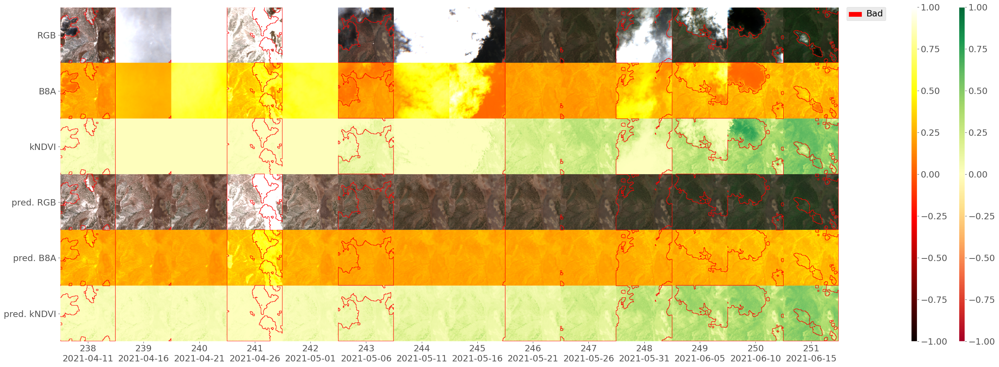

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 Validate metric                                   DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                 val_L1_custom_0                                0.0351988859474659
             val_MeanSquaredError_0                            0.058722399175167084
val_NormalizedNashSutcliffeEfficiency_custom_NNSE               0.9335823059082031
val_NormalizedNashSutcliffeEfficiency_custom_NSE                0.9288572669029236
val_NormalizedNashSutcliffeEfficiency_custom_bias              0.009564196690917015
                  val_R2Score_0                                 0.9288581609725952
                    val_loss                                    0.00996708869934082
──────────────────────────────────────────────────────────────────────────────────────────────

In [67]:
subset= 'test'

#event_id= 31833
cids_to_plot= ['-59.29_-24.07', '-59.67_-23.73', '-56.95_-25.91', '-58.38_-25.26', '-57.54_-21.98', '-56.83_-24.86', '-48.10_-21.49',
               '-59.12_-28.36', '-59.54_-24.36', '-58.79_-23.98', '-58.47_-26.73', '-58.67_-25.10', '-57.82_-25.67', '-58.42_-26.73',
               '-59.92_-27.12', '-55.81_-25.51', '-47.74_-21.33', '-58.17_-23.98', '-59.16_-26.48', '-59.00_-27.48', '-56.42_-24.11',
               '-58.79_-25.73', '-57.45_-25.75', '-60.42_-27.23']

#We edit the dataloader registry to only contain the cubes that we want to plot
#And then tell the validator to plot up to 100000 cubes
if subset == 'train':
    model_manager.train_loader.dataset.registry= model_manager.train_loader.dataset.registry.loc[cids_to_plot]
elif subset == 'val':
    model_manager.val_loader.dataset.registry= model_manager.val_loader.dataset.registry.loc[cids_to_plot]
elif subset == 'test':
    model_manager.test_loader.dataset.registry= model_manager.test_loader.dataset.registry.loc[cids_to_plot]
else:
    raise AssertionError(f'{subset=}?')
model_manager.val(subset=subset, plot=30, naive=None, blind_test=False, event_metrics=None)

In [ ]:
#We now grab the generated images and plot them here
#Double click on the images to see them full size
from IPython.display import Image, display
from pathlib import Path
image_list= list((Path('experiments') / config['experiment_id'] / 'test_plots').glob('*.jpg'))
for img in image_list[::-1][:4]: #Limit to 2
    print(img.name)
    display(Image(filename=str(img), alt=str(img)))